# Análisis Semántico

In [1]:
import os

def merge_text_files(folder_path, output_file):
    with open(output_file, 'w') as output:
        # Iterate over each file in the folder
        for filename in os.listdir(folder_path):
            if filename.endswith('.txt'):
                file_path = os.path.join(folder_path, filename)
                with open(file_path, 'r') as file:
                    # Read the content of the file and write it to the output file
                    output.write(file.read().strip() + '\n\n')

# Example usage:
folder_path = 'txt/'
output_file = 'documentos.txt'
merge_text_files(folder_path, output_file)
print("Merged output file created successfully!")

Merged output file created successfully!


In [235]:
import re

# Function to remove tildes from Spanish characters
def remove_tildes(text):
    replacements = (
        ("á", "a"), ("é", "e"), ("í", "i"), ("ó", "o"), ("ú", "u"),
        ("Á", "A"), ("É", "E"), ("Í", "I"), ("Ó", "O"), ("Ú", "U")
    )
    for a, b in replacements:
        text = text.replace(a, b)
    return text

# Open the file and read the contents
with open('documentos.txt', 'r', encoding='utf-8') as file:
    text = file.read()

# Convert to lowercase
text = text.lower()

# Remove numbers
text = re.sub(r'\d+', '', text)

# Remove tildes
text = remove_tildes(text)

# Write the processed text back to a file
with open('documentos2.txt', 'w', encoding='utf-8') as file:
    file.write(text)


In [20]:
import re

# Function to remove tildes from Spanish characters
def remove_tildes(text):
    replacements = (
        ("reproduccion ampliada de la vida", "reproduccion de la vida"),
        ("reproduccion integral de la vida","reproduccion de la vida"),
        ("reproduccion y desarrollo de la vida","reproduccion de la vida"),
        ("reproduccion de la vida","reproduccion de la vida")
    )
    for a, b in replacements:
        text = text.replace(a, b)
    return text

# Open the file and read the contents
with open('documentos2.txt', 'r', encoding='utf-8') as file:
    text = file.read()

# Convert to lowercase
text = text.lower()

# Remove numbers
text = re.sub(r'\d+', '', text)

# Remove tildes
text = remove_tildes(text)

# Write the processed text back to a file
with open('documentos3.txt', 'w', encoding='utf-8') as file:
    file.write(text)


Top2Vec es un algoritmo para el modelamiento de topicos y búsqueda semántica. Este automaticamente detecta topicos presentes en el texto permite ver conceptos cercanos.

In [1]:
import pandas as pd
import re
from top2vec import Top2Vec

/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
2024-04-19 21:30:42.349633: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-19 21:30:51.195604: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/home/alfredourrea/.local/lib/python3.10/site-packages/cudf/utils/_ptxcompiler.py:61: UserWarning: Error getting driver and runtime versions:

stdout:



stderr:

/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 

In [2]:
#print(Top2Vec.__doc__)

Los documentos se encuentran en formato .txt y separados por parrafos. En total hay 1310 párrafos.

In [2]:
def documentos(input):
    with open(input, 'r') as file:
        content = file.read()
    return content.split("\n")

docs = documentos("documentos3.txt") 
len(docs)

725

In [6]:
def documentos(input):
    with open(input, 'r') as file:
        content = file.read()
    return content.split("\n")

docs1 = documentos("documentos3.txt") 
len(docs1)

725

In [3]:
import spacy

# Load the Spanish NLP model provided by Spacy
nlp = spacy.load("es_core_news_sm")

In [4]:
# Function to lemmatize and clean up text
def lemmatize_text(text):
    # Create a Spacy document
    doc = nlp(text)
    # Return lemmatized tokens that are not stop words or punctuations
    return [token.lemma_.lower() for token in doc if not token.is_stop and not token.is_punct]

In [7]:
# Assuming you have a list of documents in 'documents'
lemmatized_documents = [" ".join(lemmatize_text(doc)) for doc in docs1]


Ajuste de parámetros para la creación del modelo.

In [23]:
umap_args = {'n_neighbors': 18,
             'n_components': 10,
             'metric': 'cosine',
             "random_state": 42,
             }

hdbscan_args = {'min_cluster_size': 7,
                'min_samples': 1,
                'metric': 'euclidean',
                'cluster_selection_method': 'eom'
               }

In [9]:
import nltk
nltk.download('stopwords')

def remove_stopwords(text):
    stopwords = nltk.corpus.stopwords.words('spanish')
    stopwords = stopwords + ['trata', 'pues', 'vez', 'ven', 'modo','da', 'van', 'tal', 'dos', 'respecto', 'as', 'ello', 've', 'decir', 'hacia', 'continuación', 'ess', 'et', 'in', 'así','refiere', 'dan', 'dicha', 'realizó', 'cuyo', 'mediante', 'nun','etc', 'plantea', 'va', 'masa', 'supone', 'luego', 'manera', 'hace','punto', 'co', 'entonces', 'hecho', 'según', 'siguientes', 'realizada','puesto', 'además', 'consecuencia', 'debido']
    text = [word for word in text if word not in stopwords]
    return text

def tok(text):
    import gensim
    text = gensim.utils.simple_preprocess(text)
    text = remove_stopwords(text)
    return text

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/alfredourrea/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [24]:
model = Top2Vec(lemmatized_documents, 
                speed = "deep-learn", #fast-learn, deep-learn
                min_count = 4, 
                ngram_vocab = True,
                umap_args = umap_args,
                hdbscan_args = hdbscan_args,
                embedding_model = "universal-sentence-encoder-multilingual",
                tokenizer = tok
               )
print(len(model.vocab), model.get_num_topics())

2024-04-19 22:24:17,040 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
/home/alfredourrea/.local/lib/python3.10/site-packages/sklearn/feature_extraction/text.py:525: UserWarning:

The parameter 'token_pattern' will not be used since 'tokenizer' is not None'

2024-04-19 22:24:18,721 - top2vec - INFO - Downloading universal-sentence-encoder-multilingual model
INFO:top2vec:Downloading universal-sentence-encoder-multilingual model
2024-04-19 22:24:24,444 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2024-04-19 22:24:48,334 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
/home/alfredourrea/.local/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

2024-04-19 22:24:56,177 - top2vec - INFO - Find

1767 33


In [25]:
import umap
from umap import UMAP

doc_vecs = model.document_vectors

umap_3d = umap.UMAP(**umap_args)
proj_3d = umap_3d.fit_transform(doc_vecs)

/home/alfredourrea/.local/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [26]:
import hdbscan
from hdbscan import HDBSCAN
cluster = hdbscan.HDBSCAN(**hdbscan_args).fit(proj_3d)

In [27]:
topic_words = model.get_topics()[0] 
#print(cluster.labels_)
top_3_topic_words = [words[:5] for words in topic_words]
#doc_top_3_words = [top_3_topic_words[label] for label in cluster.labels_]

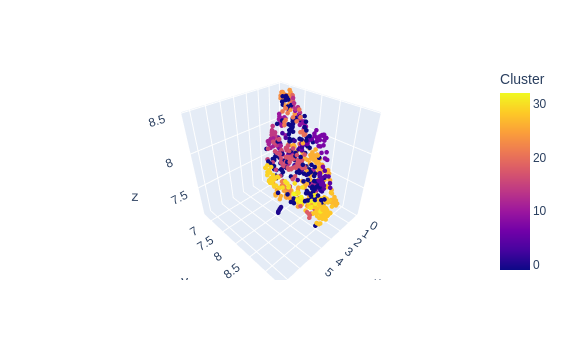

In [28]:
import pandas as pd
import plotly.express as px

x, y, z = proj_3d[:,0], proj_3d[:,1], proj_3d[:,2]
# Prepare the DataFrame
df = pd.DataFrame({
    'x': x,
    'y': y,
    'z': z,
    #'Top 3 Topic Words': ['; '.join(words) for words in doc_top_3_words],  # Joining the top 3 words for hover info
    'Cluster': cluster.labels_
})

# Generate the 3D scatter plot
fig_3d = px.scatter_3d(
    df, x='x', y='y', z='z',
    color='Cluster',
    #hover_data=['Top 3 Topic Words']  # Include the top 3 topic words in the hover data
)

fig_3d.update_traces(marker_size=1.5)  # Adjust marker size for better visibility if needed
fig_3d.show()


In [29]:
bigrams = []
for word in model.vocab:
    if len(word.split()) == 2:
        bigrams.append(word)
print(len(bigrams))
#print(model.vocab)
print(bigrams)

168
['economia popular', 'empleo registrado', 'millón persona', 'forma legal', 'mercado trabajo', 'reproduccion vida', 'derecho laboral', 'ultimo año', 'fuente informacion', 'numero base', 'metodologica propuesta', 'propuesta medicion', 'instituto nacional', 'aglomerado urbano', 'peso relativo', 'sub población', 'politica publica', 'seguridad social', 'sector popular', 'servicio domestico', 'familiar remuneracion', 'unidad productivo', 'forma insercion', 'bajo productividad', 'trabajador familiar', 'salario minimo', 'trabajar hora', 'sociedad capitalista', 'nivel ingreso', 'nivel educativo', 'bajo ingreso', 'produccion bien', 'condición vida', 'categoria ocupacional', 'cuentapropista profesional', 'principal fuente', 'rama actividad', 'ocupacion principal', 'actividad economica', 'fuerza trabajo', 'satisfaccion necesidad', 'calidad vida', 'individual familiar', 'proyecto politico', 'trabajo asalariado', 'acumulacion capital', 'unidad economica', 'relación economica', 'economia informal

Podemos tambien ver los algunos de los tópicos y las palabras relevantes/relacionadas/cercanas.

In [89]:
topic_words, word_scores, topic_nums = model.get_topics(num_topics = 2)
#print(topic_words)

Procedemos a generar nubes de palabras para identificar las palabras clave de cada tópico. 

In [90]:
topic_words, word_scores, topic_nums = model.get_topics(num_topics=10)
#for topic in topic_nums:
    #model.generate_topic_wordcloud(topic)

In [91]:
#print(topic_words)

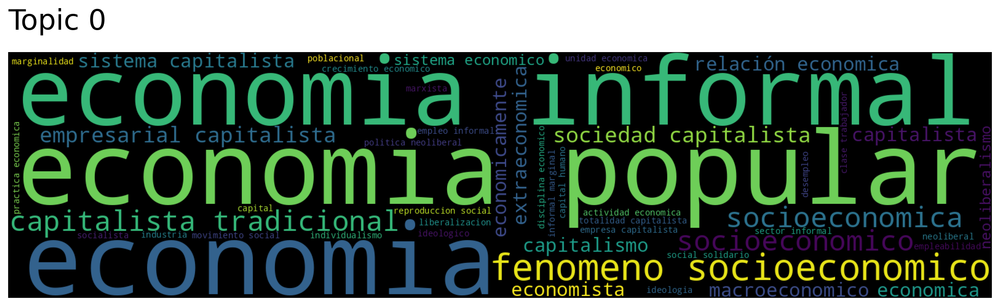

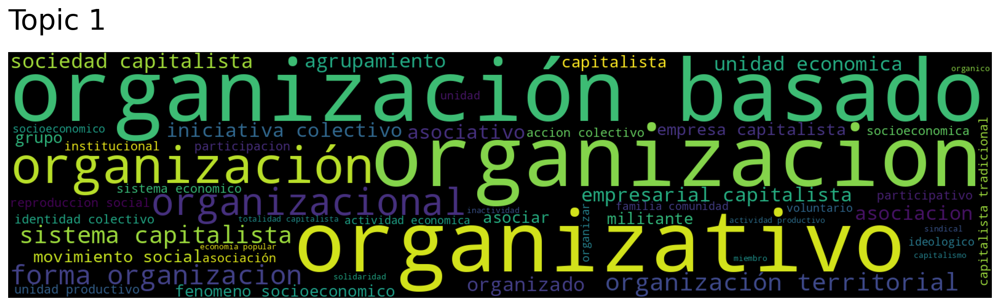

In [30]:
model.hierarchical_topic_reduction(num_topics=20)
for i in range(2):
    model.generate_topic_wordcloud(i, reduced = "True")

Adicionalmente podemos generar nubes de palabras relacionadas con palabras identificadas en el vocabulario. En este caso particular podemos buscar los 5 tópicos mas relevantes/cercanos a las palabras "solidaridad y vida".

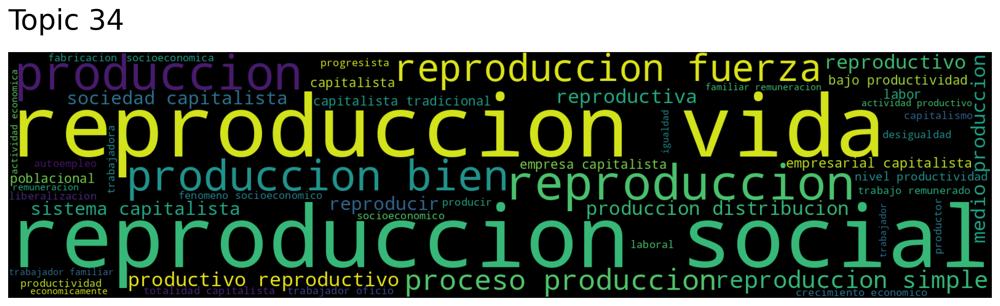

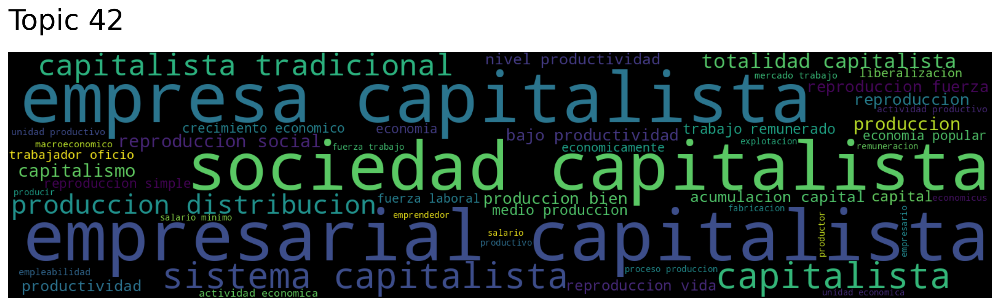

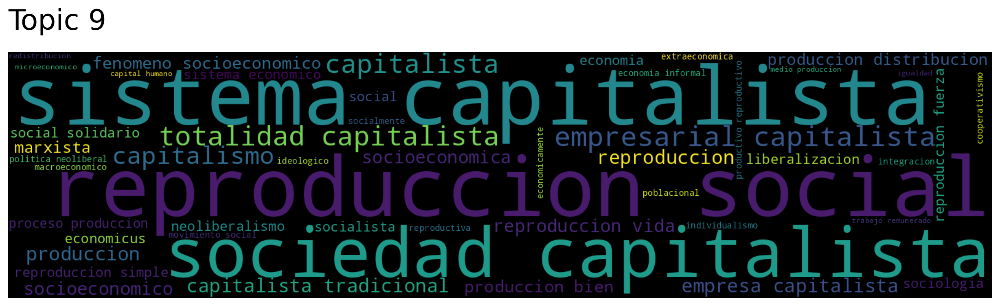

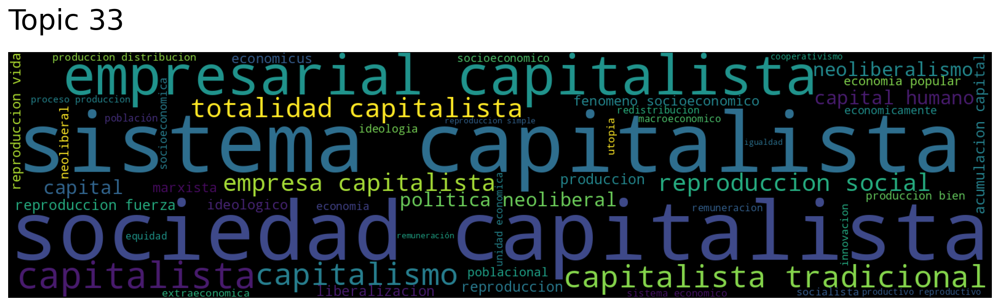

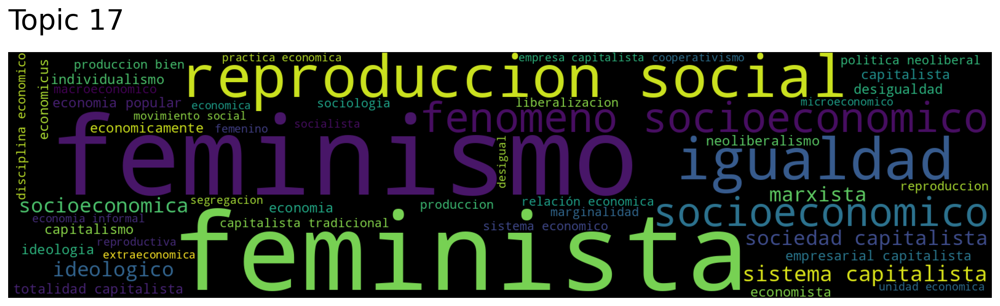

In [52]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["reproduccion"], num_topics=5)
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)

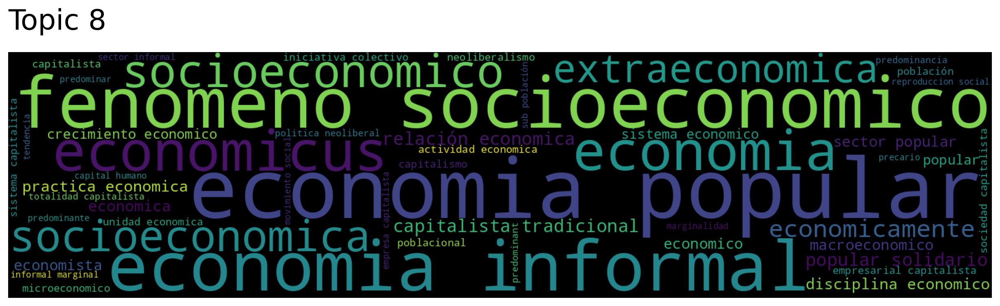

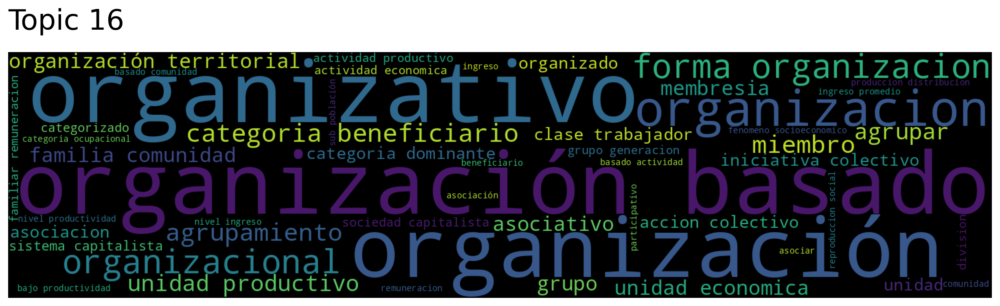

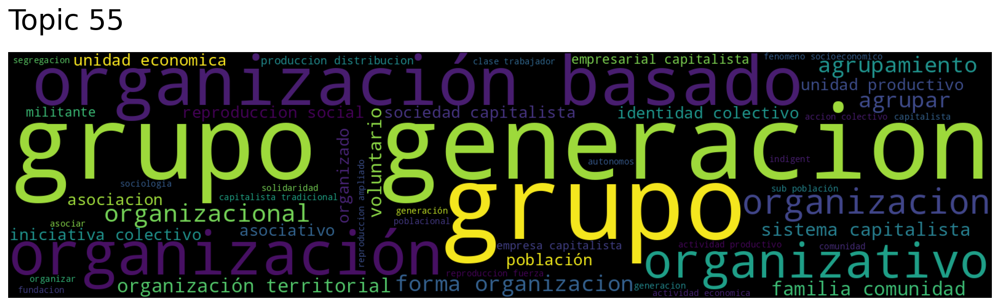

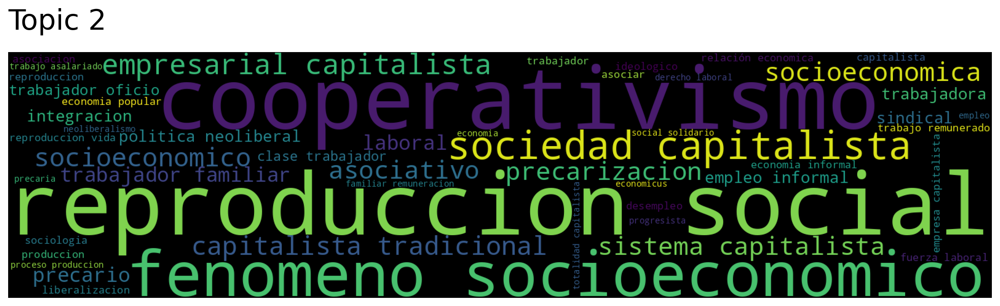

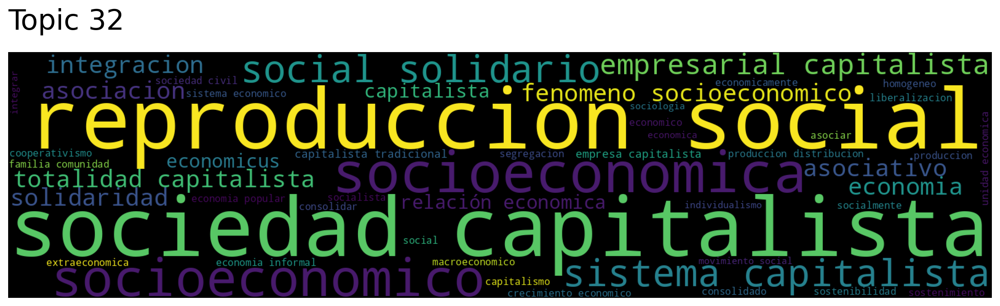

In [19]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["colectivo"], num_topics=6)
for topic in topic_nums:
    if topic != 22:
        model.generate_topic_wordcloud(topic)

5


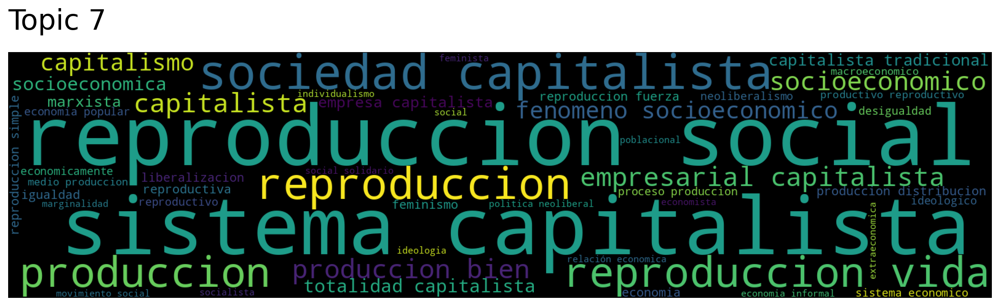

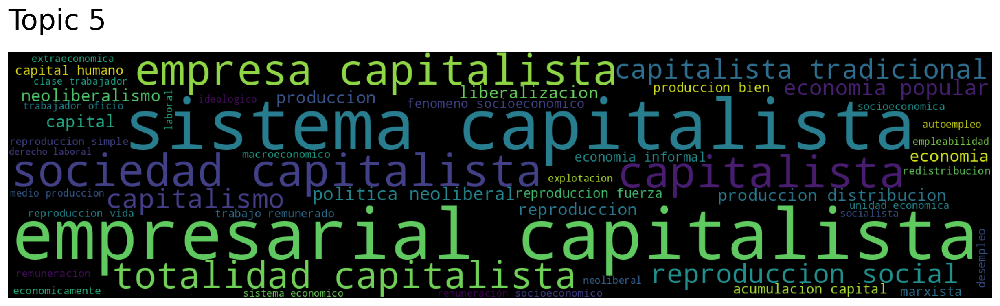

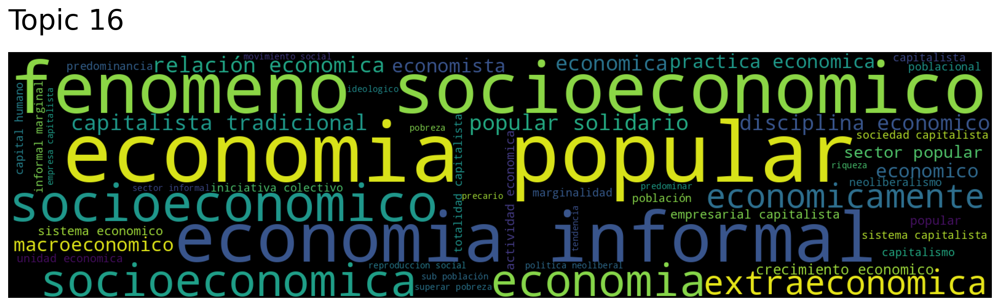

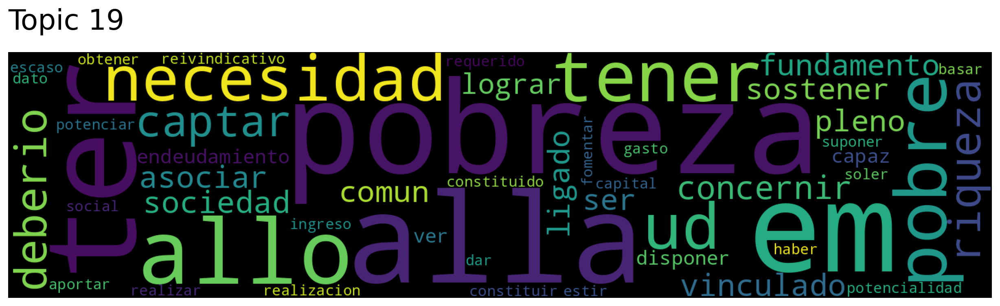

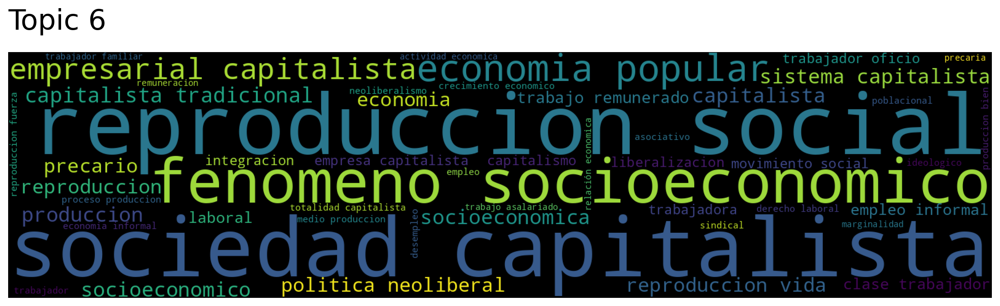

In [31]:
model.hierarchical_topic_reduction(num_topics=20)

topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["reproduccion vida"], num_topics=5, reduced = "True")

for i in range(5):
    model.topic_words_reduced[i] = ["reproduccion de la vida" if word == "reproduccion vida" else word for word in model.topic_words_reduced[i]]

print(len(topic_words))
#print(word_scores)
#model.generate_topic_wordcloud(topic_nums[0], reduced = True)
for topic in topic_nums:
    model.generate_topic_wordcloud(topic, reduced = True)

In [94]:
#print(topic_words[0])
#model.topic_words_reduced[0],

In [32]:
model.save("model_EP4")